<a href="https://colab.research.google.com/github/ANS-Research/Style-transfer-MRI-using-cyclegan/blob/main/MRI_CycleGAN_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  Style Transfer using CycleGAN for MRI Images

### Importing Libraries

In [48]:
%pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-701rko9n
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-701rko9n
  Resolved https://github.com/tensorflow/docs to commit 97ac0aea73f1cf802004049f92bd3a985010d7e5
  Preparing metadata (setup.py) ... done


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/MRI+T1_T2+Dataset.zip

Archive:  /content/MRI+T1_T2+Dataset.zip
   creating: MRI+T1_T2+Dataset/
   creating: MRI+T1_T2+Dataset/Tr1/
  inflating: MRI+T1_T2+Dataset/Tr1/.DS_Store  
   creating: MRI+T1_T2+Dataset/Tr1/TrainT1/
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #10.png  
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #11.png  
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #12.png  
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #13.png  
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #14.png  
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #15.png  
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #16.png  
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #17.png  
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #18.png  
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #19.png  
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #23.png  
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #24.png  
  inflating: MRI+T1_T2+Dataset/Tr1/TrainT1/Image #25.png  
  inflating: MRI+T1_T2+Dataset/Tr

In [ ]:
! pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.1/612.1 kB 5.4 MB/s eta 0:00:00


In [ ]:
# Library for image processing and visualization
from skimage.transform import resize
from PIL import Image
import imageio
import matplotlib.pyplot as plt
%matplotlib inline

# Library for handling file operations
import os

# Library for handling array operations
import numpy as np

# Library for handling deep learning
import tensorflow as tf
from keras.utils.vis_utils import plot_model
import tensorflow_addons as tfa
autotune = tf.data.AUTOTUNE

# Library for Miscellaneous tasks
import warnings

warnings.filterwarnings("ignore")

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


### Data loading and preprocessing

In [ ]:
# Path for images in Sample dataset provided
t1 = "/content/MRI+T1_T2+Dataset/Tr1/TrainT1/"
t2 = "/content/MRI+T1_T2+Dataset/Tr2/TrainT2/"

# Image size
img_height = 128
img_width = 128

In [ ]:
# list of images
t1_images = [t1 + i for i in os.listdir(t1)]
t2_images = [t2 + i for i in os.listdir(t2)]

In [ ]:
# Images count for each category
print("\n\nTotal Images in each category:\n")
print(f"t1: {len(t1_images)}")
print(f"t2: {len(t2_images)}")



Total Images in each category:

t1: 43
t2: 46




Sample Images from each category:



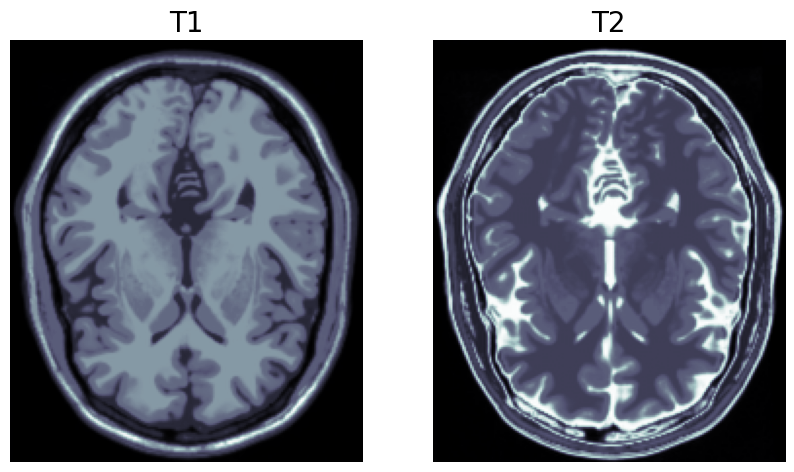

In [ ]:
# Priting sample images from each category
print("\n\nSample Images from each category:\n")
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(plt.imread(t1_images[0]), cmap="bone")
plt.title("T1", fontsize=20)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(plt.imread(t2_images[0]), cmap="bone")
plt.title("T2", fontsize=20)
plt.axis("off")
plt.show()

In [ ]:
# function to load images and resize
def load_images(img_list):
    img_arr = []
    for img in img_list:
        img = Image.open(img)
        img_arr.append(np.array(img))
    return np.array(img_arr)

In [ ]:
t1_images = load_images(t1_images)
t2_images = load_images(t2_images)

In [ ]:
# information of dataset
print("\n\nInformation of dataset:\n")
print(f"t1: {t1_images.shape}")
print(f"t2: {t2_images.shape}")



Information of dataset:

t1: (43, 217, 181)
t2: (46, 217, 181)


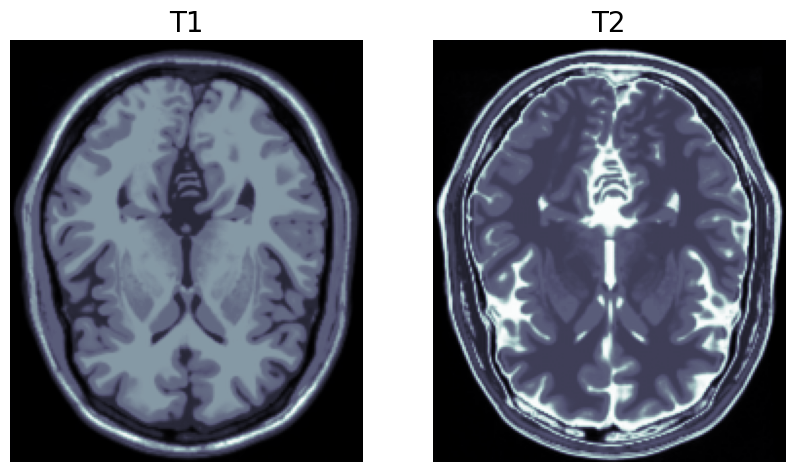

In [ ]:
# Printing sample images from each category after preprocessing
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(t1_images[0], cmap="bone")
plt.title("T1", fontsize=20)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(t2_images[0], cmap="bone")
plt.title("T2", fontsize=20)
plt.axis("off")
plt.show()

In [ ]:
# Function to normalize images
def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    return (img / 127.5) - 1.0

In [ ]:
# Function to preprocess images
def preprocess_images(img):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.resize(img, [*(img_height, img_width)])
    img = tf.image.random_crop(img, size=[*(img_height, img_width, 1)])
    img = normalize_img(img)
    return img

In [ ]:
# reshaping array to format (height, width, channels) with channels = 1
t1_images = t1_images.reshape(
    t1_images.shape[0], t1_images.shape[1], t1_images.shape[2], 1
).astype("float32")
t2_images = t2_images.reshape(
    t2_images.shape[0], t2_images.shape[1], t2_images.shape[2], 1
).astype("float32")

In [ ]:
# Daataset augmentation
data_augmentation = tf.keras.Sequential([tf.keras.layers.RandomFlip("horizontal")])
t1_images = np.concatenate([data_augmentation(t1_images), t1_images], axis=0)
t2_images = np.concatenate([data_augmentation(t2_images), t2_images], axis=0)

In [ ]:
t1_images = [preprocess_images(image) for image in t1_images]
t2_images = [preprocess_images(image) for image in t2_images]

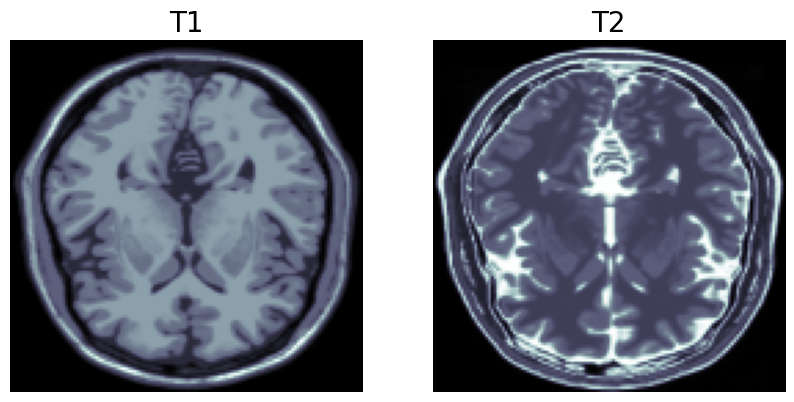

In [ ]:
# Printing sample images from each category after preprocessing
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(t1_images[0], cmap="bone")
plt.title("T1", fontsize=20)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(t2_images[0], cmap="bone")
plt.title("T2", fontsize=20)
plt.axis("off")
plt.show()

### Data Batch Creation

In [ ]:
# defining batch and buffer size
buffer_size = 256
batch_size = 1

In [ ]:
t1_images = (
    tf.data.Dataset.from_tensor_slices(t1_images)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
t2_images = (
    tf.data.Dataset.from_tensor_slices(t2_images)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

### Creating Generator and Discriminator

In [ ]:
# Weights initializer for the layers.
kernel_init = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

In [ ]:
# Downsampling method
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0.0, 0.02)
    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(
            filters,
            size,
            strides=2,
            padding="same",
            kernel_initializer=initializer,
            use_bias=False,
        )
    )
    if apply_norm:
        result.add(tfa.layers.InstanceNormalization())
    result.add(tf.keras.layers.LeakyReLU())
    return result

In [ ]:
# Upsampling method
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0.0, 0.02)
    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2DTranspose(
            filters,
            size,
            strides=2,
            padding="same",
            kernel_initializer=initializer,
            use_bias=False,
        )
    )
    result.add(tfa.layers.InstanceNormalization())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result

In [ ]:
def unet_generator():
    down_stack = [
        downsample(128, 4, apply_norm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]
    # create a stack of downsample models
    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(128, 4),
    ]  # create a stack of upsample models

    initializer = tf.random_normal_initializer(0.0, 0.02)
    last = tf.keras.layers.Conv2DTranspose(
        1,
        4,
        strides=2,
        padding="same",
        kernel_initializer=initializer,
        activation="tanh",
    )
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[128, 128, 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

In [ ]:
# Creating generator models
generator_g = unet_generator()
generator_f = unet_generator()

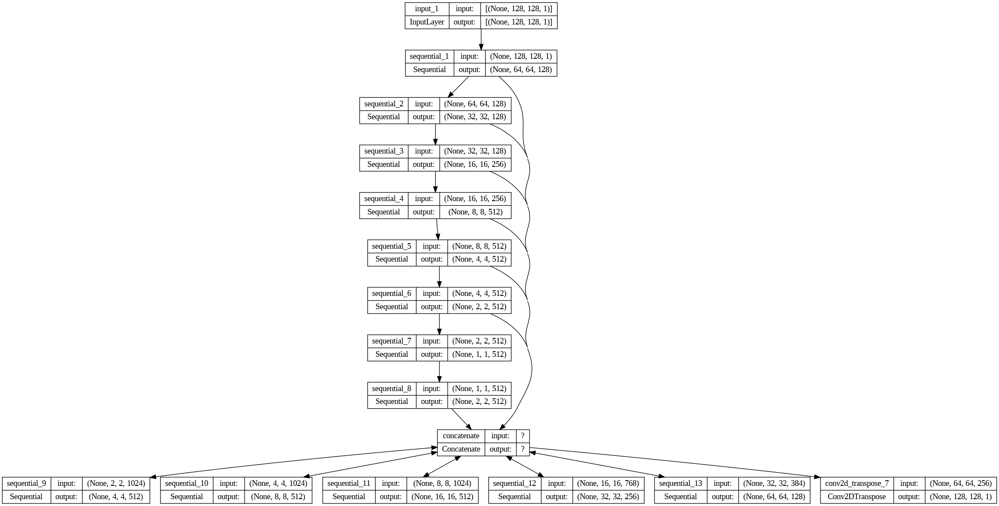

In [ ]:
# Printing summary of generator g
plot_model(generator_g, show_shapes=True)

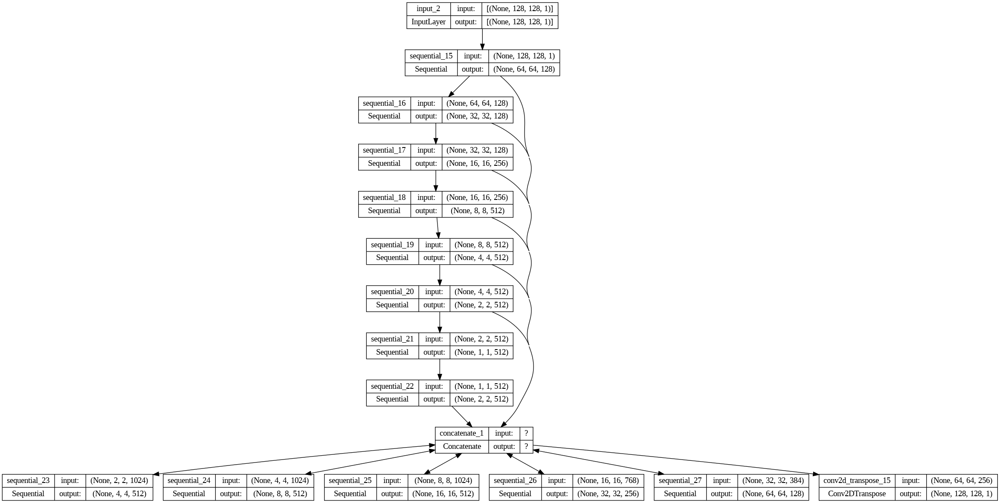

In [ ]:
# Printing summary of generator f
plot_model(generator_f, show_shapes=True)

In [ ]:
# function for discriminator
def discriminator():
    in_image = tf.keras.layers.Input(shape=[128, 128, 1], name="input_image")
    d = tf.keras.layers.Conv2D(
        64, (4, 4), strides=(2, 2), padding="same", kernel_initializer=kernel_init
    )(in_image)
    d = tf.keras.layers.LeakyReLU(alpha=0.2)(d)
    d = tf.keras.layers.Conv2D(
        128, (4, 4), strides=(2, 2), padding="same", kernel_initializer=kernel_init
    )(d)
    d = tfa.layers.InstanceNormalization(axis=-1)(d)
    d = tf.keras.layers.LeakyReLU(alpha=0.2)(d)
    d = tf.keras.layers.Conv2D(
        256, (4, 4), strides=(2, 2), padding="same", kernel_initializer=kernel_init
    )(d)
    d = tfa.layers.InstanceNormalization(axis=-1)(d)
    d = tf.keras.layers.LeakyReLU(alpha=0.2)(d)
    d = tf.keras.layers.Conv2D(
        512, (4, 4), strides=(2, 2), padding="same", kernel_initializer=kernel_init
    )(d)
    d = tfa.layers.InstanceNormalization(axis=-1)(d)
    d = tf.keras.layers.LeakyReLU(alpha=0.2)(d)
    d = tf.keras.layers.Conv2D(
        512, (4, 4), padding="same", kernel_initializer=kernel_init
    )(d)
    d = tfa.layers.InstanceNormalization(axis=-1)(d)
    d = tf.keras.layers.LeakyReLU(alpha=0.2)(d)
    patch_out = tf.keras.layers.Conv2D(
        1, (4, 4), padding="same", kernel_initializer=kernel_init
    )(d)
    return tf.keras.models.Model(in_image, patch_out)

In [ ]:
# Creating generator models
discriminator_x = discriminator()
discriminator_y = discriminator()

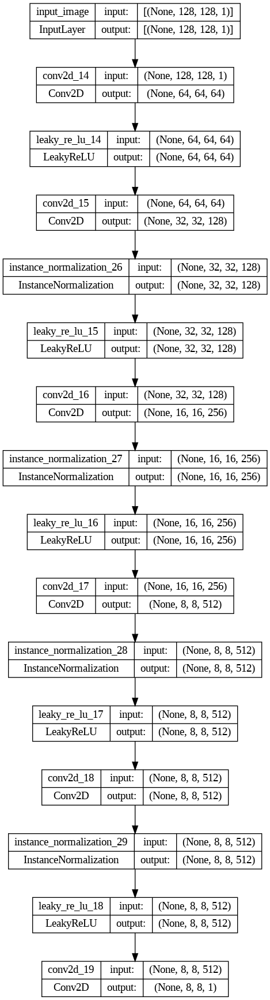

In [ ]:
# Printing summary of generator g
plot_model(discriminator_x, show_shapes=True)

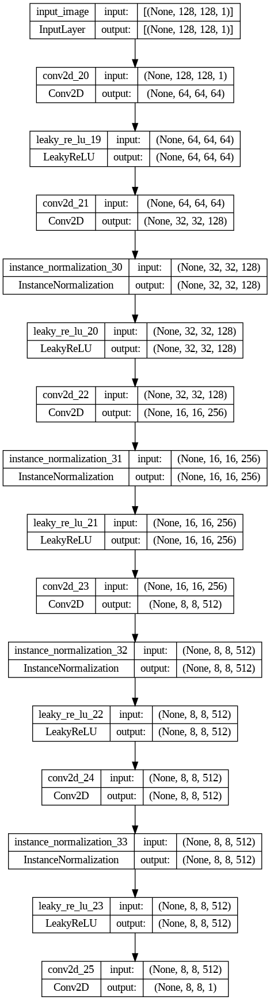

In [ ]:
# Printing summary of generator f
plot_model(discriminator_y, show_shapes=True)

### Defining Loss Functions

In [ ]:
# Binary cross entropy loss function
bce_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
# Define the loss function for the generators
def generator_loss(generated):
    return bce_loss(tf.ones_like(generated), generated)

In [ ]:
# function for discriminator loss
def discriminator_loss(real, generated):
    real_loss = bce_loss(tf.ones_like(real), real)
    generated_loss = bce_loss(tf.zeros_like(generated), generated)
    return (real_loss + generated_loss) * 0.5

In [ ]:
# Cycle consistency loss function
def calc_cycle_loss(real_image, cycled_image):
    return tf.reduce_mean(tf.abs(real_image - cycled_image))

In [ ]:
# Identity loss function
def identity_loss(real_image, same_image):
    return tf.reduce_mean(tf.abs(real_image - same_image))

Parameters for Loss Function defined in CycleGAN Model class (10,0.5)

### Defining Optimizers

In [ ]:
# Leveraging Adam Optimizer to smoothen gradient descent
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

### CycleGAN Model

In [ ]:
class CycleGan(tf.keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def call(self, inputs):
        return (
            self.disc_X(inputs),
            self.disc_Y(inputs),
            self.gen_G(inputs),
            self.gen_F(inputs),
        )

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn,
    ):
        super().compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn

    def train_step(self, batch_data):
        real_x, real_y = batch_data
        with tf.GradientTape(persistent=True) as tape:
            fake_y = self.gen_G(real_x, training=True)
            fake_x = self.gen_F(real_y, training=True)

            cycled_x = self.gen_F(fake_y, training=True)
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adversarial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
            "Total_Generator_Loss": total_loss_G+total_loss_F,
        }

### CallBacks defined

In [ ]:
# Getting Sample Image
t1_sample = t1_images.shuffle(buffer_size).as_numpy_iterator().next()
t2_sample = t2_images.shuffle(buffer_size).as_numpy_iterator().next()


class GANMonitor(tf.keras.callbacks.Callback):
    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_train_begin(self, epoch, logs=None):
        prediction1 = self.model.gen_G.predict(t1_sample)
        prediction2 = self.model.gen_F.predict(t2_sample)
        fig = plt.figure(figsize=(8, 4))
        display_list = [t1_sample[0], prediction1[0], t2_sample[0], prediction2[0]]
        title = ["Input Image", "Generated Image", "Input Image", "Generated Image"]
        for i in range(4):
            plt.subplot(1, 4, i + 1)
            plt.title(title[i])
            plt.imshow(display_list[i][:, :, 0], cmap="gray")
            plt.axis("off")
        fig.suptitle("CycleGAN Sample Output Before Training", fontsize=16)
        plt.savefig("IMG/image_at_epoch_0.png")
        plt.show()
        plt.close()

    def on_epoch_end(self, epoch, logs=None):
        prediction1 = self.model.gen_G.predict(t1_sample)
        prediction2 = self.model.gen_F.predict(t2_sample)
        fig = plt.figure(figsize=(8, 4))
        display_list = [t1_sample[0], prediction1[0], t2_sample[0], prediction2[0]]
        title = ["Input Image", "Generated Image", "Input Image", "Generated Image"]
        for i in range(4):
            plt.subplot(1, 4, i + 1)
            plt.title(title[i])
            plt.imshow(display_list[i][:, :, 0], cmap="gray")
            plt.axis("off")
        fig.suptitle(f"CycleGAN Sample Output After epoch {epoch+1}", fontsize=16)
        plt.savefig(f"IMG/image_at_epoch_{epoch+1}.png")
        plt.show()
        plt.close()

In [ ]:
# Checkpoint callback
checkpoint_filepath = (
    "./checkpoints"
)
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    monitor="Total_Generator_Loss",filepath=checkpoint_filepath, save_weights_only=True, save_freq="epoch",save_best_only=True
)

### Model Training

In [ ]:
# Defining epochs
epochs = 300

In [ ]:
# create a CycleGAN model
cycle_gan_model = CycleGan(
    generator_F=generator_f,
    generator_G=generator_g,
    discriminator_X=discriminator_x,
    discriminator_Y=discriminator_y,
)

In [ ]:
# compile the model
cycle_gan_model.compile(
    gen_G_optimizer=generator_g_optimizer,
    gen_F_optimizer=generator_f_optimizer,
    disc_X_optimizer=discriminator_x_optimizer,
    disc_Y_optimizer=discriminator_y_optimizer,
    gen_loss_fn=generator_loss,
    disc_loss_fn=discriminator_loss,
    cycle_loss_fn=calc_cycle_loss,
    identity_loss_fn=identity_loss,
)

In [ ]:
# Callbacks
plotter = GANMonitor()

In [ ]:
# Define the directory where generated images will be saved
output_directory = 'IMG'  # You can change this to your desired directory

# Create the directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

In [ ]:
# Fit the model
history = cycle_gan_model.fit(
    tf.data.Dataset.zip((t1_images, t2_images)),
    epochs=epochs,
    callbacks=[plotter],
)

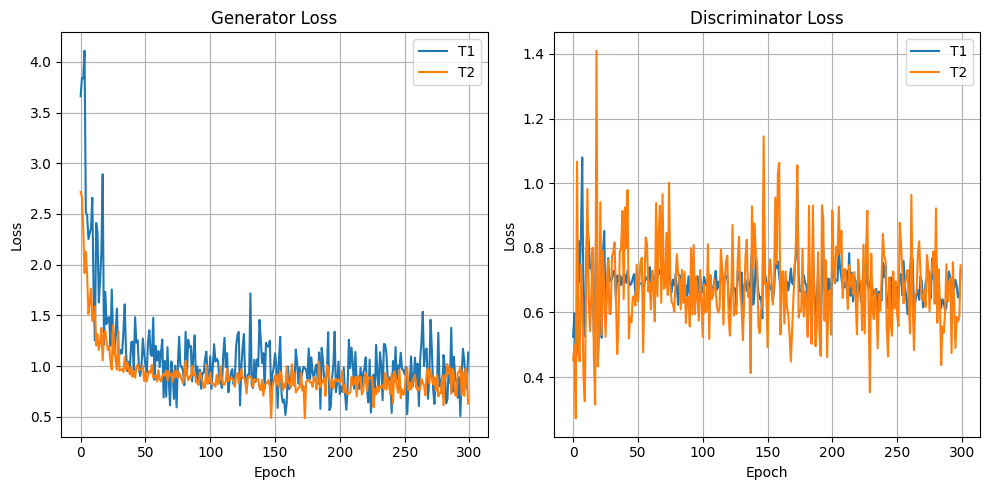

In [49]:
def plot_hist(hist):
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    plt.plot(hist.history["G_loss"])
    plt.plot(hist.history["F_loss"])
    plt.legend(["T1", "T2"])
    plt.title("Generator Loss")
    plt.ylabel("Loss")
    plt.xlabel("Epoch")
    plt.grid()
    plt.subplot(122)
    plt.plot(hist.history["D_X_loss"])
    plt.plot(hist.history["D_Y_loss"])
    plt.title("Discriminator Loss")
    plt.ylabel("Loss")
    plt.xlabel("Epoch")
    plt.grid()
    plt.legend(["T1", "T2"])
    plt.tight_layout()
    plt.show()


plot_hist(history)

### Checking the output of the model

In [50]:
anim_file = "cyclegan_mri_pre.gif"
pro_img_path = "./IMG/"
filenames = [pro_img_path + i for i in os.listdir(pro_img_path)]
filenames = sorted(filenames, key=os.path.getmtime)
img_list = [imageio.imread(filename) for filename in filenames]
imageio.mimsave(anim_file, img_list, duration=2, loop=1)


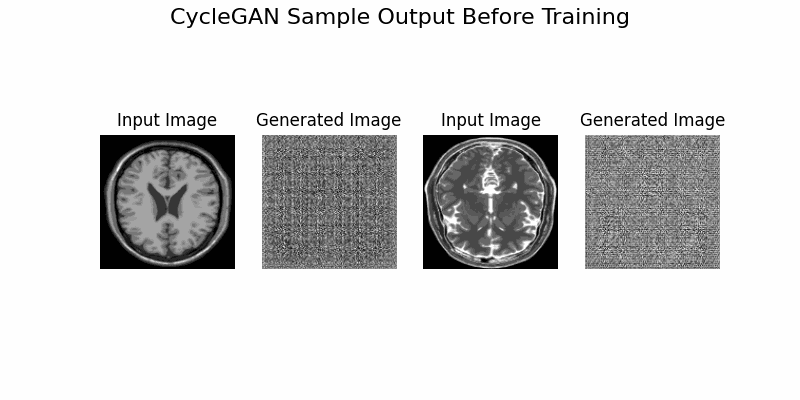

In [51]:
import tensorflow_docs.vis.embed as embed

embed.embed_file(anim_file)

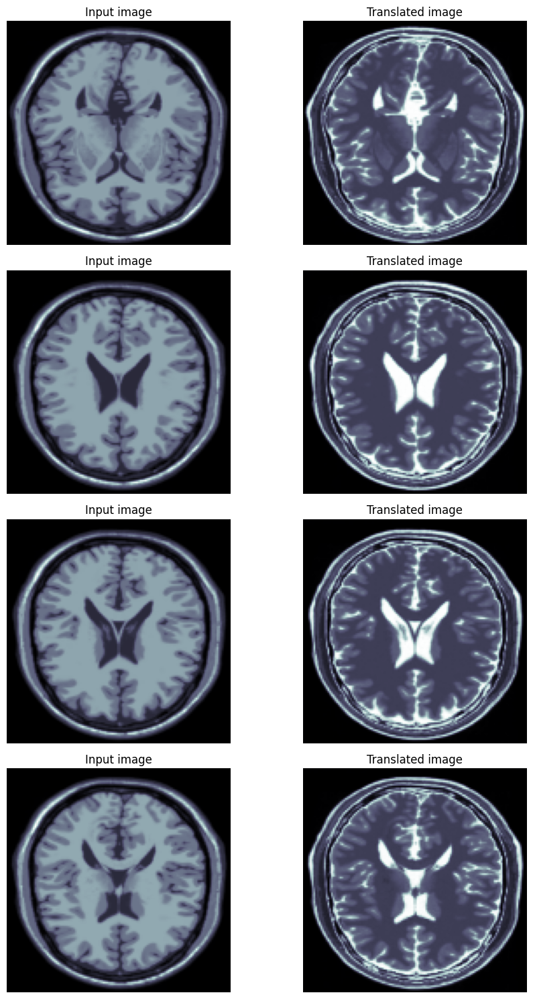

In [52]:
# evaluate the model for T1 to T2
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(t1_images.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img, cmap="bone")
    ax[i, 1].imshow(prediction, cmap="bone")
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = tf.keras.utils.array_to_img(prediction)
plt.tight_layout()
plt.show()

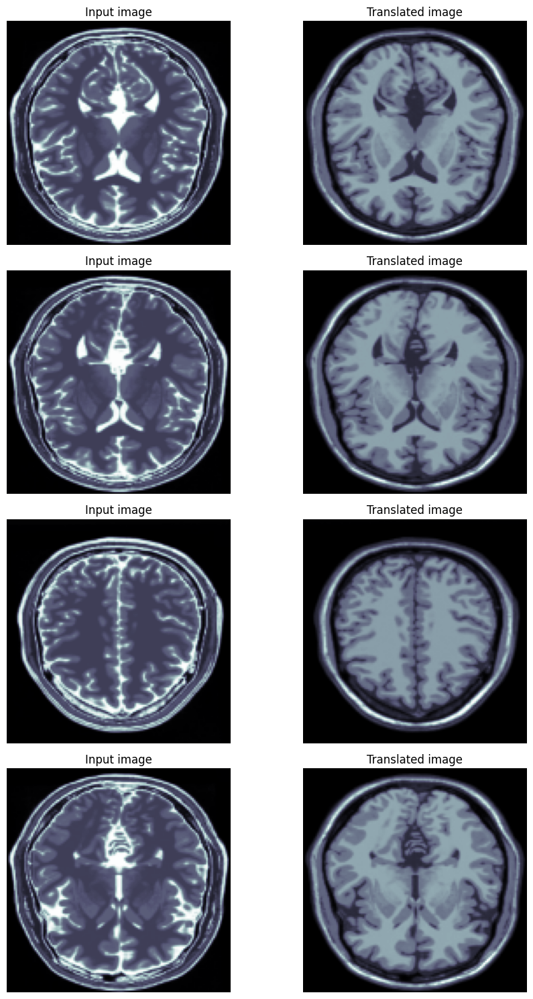

In [53]:
# evaluate the model for T2 to T1
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(t2_images.take(4)):
    prediction = cycle_gan_model.gen_F(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img, cmap="bone")
    ax[i, 1].imshow(prediction, cmap="bone")
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = tf.keras.utils.array_to_img(prediction)
plt.tight_layout()
plt.show()